In [95]:
import numpy as np
import os
import matplotlib.pyplot as plt

from matplotlib.pyplot import grid

from sklearn.datasets import make_classification, load_breast_cancer
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [97]:
import sys
sys.path.append("..")

from analysis_methods.drift_component_analysis import DriftComponentAnalysis

In [ ]:
def plot_pca_inverse_boundary(X_train_scaled, y_train, model, grid_points=1000, title_prefix="", use_proba=False):
    """
    Plots a decision boundary or probability gradient in 2D PCA space 
    for an N-dimensional trained model.
    """
    plt.figure(figsize=(9, 6))
    
    # 1. Fit PCA on standardized training data
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X_train_scaled)
    explained_variance = np.sum(pca.explained_variance_ratio_) * 100
    
    # 2. Define grid boundaries
    x_min, x_max = X_pca[:, 0].min() - 1, X_pca[:, 0].max() + 1
    y_min, y_max = X_pca[:, 1].min() - 1, X_pca[:, 1].max() + 1
    
    # 3. Create grid
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, grid_points),
                         np.linspace(y_min, y_max, grid_points))
    
    grid_2d = np.c_[xx.ravel(), yy.ravel()]
    
    # 4. Inverse transform to N-dimensional scaled space
    grid_nd_scaled = pca.inverse_transform(grid_2d)
    
    # 5. Predict using the N-dimensional model
    if use_proba and hasattr(model, "predict_proba"):
        # Extract the probability of the positive class (class 1)
        Z = model.predict_proba(grid_nd_scaled)[:, 1]
        # Use a diverging colormap with smooth levels for probabilities
        cmap = plt.cm.RdBu
        levels = np.linspace(0, 1, 21)
    else:
        # Fallback to hard predictions
        Z = model.predict(grid_nd_scaled)
        cmap = plt.cm.RdYlBu
        levels = None
        
    Z = Z.reshape(xx.shape)
    
    # 6. Plotting logic
    if use_proba:
        # Plot filled contours for probabilities with fixed 0 to 1 scale
        contour = plt.contourf(xx, yy, Z, levels=levels, alpha=0.8, cmap=cmap, vmin=0, vmax=1)
        plt.colorbar(contour, label="Probability of Class 1")
    else:
        # Plot standard discrete decision regions
        plt.contourf(xx, yy, Z, alpha=0.4, cmap=cmap)
        
    # Plot original training data
    # We use RdYlBu for the scatter points to clearly contrast the two discrete classes
    plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_train, 
                s=30, edgecolor='k', cmap=plt.cm.RdYlBu)
    
    plt.title(f"{title_prefix}\nExplained Variance: {explained_variance:.1f}%")
    plt.xlabel("Principal Component 1")
    plt.ylabel("Principal Component 2")
    plt.tight_layout()
    plt.show()

In [58]:
n_features = 5
X_sim, y_sim = make_classification(n_samples=4000, n_features=n_features, 
                                   n_informative=5, n_redundant=0, 
                                   random_state=42, class_sep=1.5)

# Standardize the data
scaler_sim = StandardScaler()
X_sim_scaled = scaler_sim.fit_transform(X_sim)

rf_sim = RandomForestClassifier(n_estimators=100, random_state=42)
rf_sim.fit(X_sim_scaled, y_sim)

svm_sim = SVC(kernel='rbf', probability=True, random_state=42)
svm_sim.fit(X_sim_scaled, y_sim)

# Cancer data
cancer_data = load_breast_cancer()
X_real, y_real = cancer_data.data, cancer_data.target
scaler_real = StandardScaler()
X_real_scaled = scaler_real.fit_transform(X_real)

rf_real = RandomForestClassifier(n_estimators=100, random_state=42)
rf_real.fit(X_real_scaled, y_real)

svm_real = SVC(kernel='rbf', probability=True, random_state=42)
svm_real.fit(X_real_scaled, y_real)

,"C C: float, default=1.0Regularization parameter. The strength of the regularization isinversely proportional to C. Must be strictly positive. The penaltyis a squared l2 penalty. For an intuitive visualization of the effectsof scaling the regularization parameter C, see:ref:`sphx_glr_auto_examples_svm_plot_svm_scale_c.py`.",1.0
,"kernel kernel: {'linear', 'poly', 'rbf', 'sigmoid', 'precomputed'} or callable, default='rbf'Specifies the kernel type to be used in the algorithm. Ifnone is given, 'rbf' will be used. If a callable is given it is used topre-compute the kernel matrix from data matrices; that matrix should bean array of shape ``(n_samples, n_samples)``. For an intuitivevisualization of different kernel types see:ref:`sphx_glr_auto_examples_svm_plot_svm_kernels.py`.",'rbf'
,"degree degree: int, default=3Degree of the polynomial kernel function ('poly').Must be non-negative. Ignored by all other kernels.",3
,"gamma gamma: {'scale', 'auto'} or float, default='scale'Kernel coefficient for 'rbf', 'poly' and 'sigmoid'.- if ``gamma='scale'`` (default) is passed then it uses 1 / (n_features * X.var()) as value of gamma,- if 'auto', uses 1 / n_features- if float, must be non-negative... versionchanged:: 0.22 The default value of ``gamma`` changed from 'auto' to 'scale'.",'scale'
,"coef0 coef0: float, default=0.0Independent term in kernel function.It is only significant in 'poly' and 'sigmoid'.",0.0
,"shrinking shrinking: bool, default=TrueWhether to use the shrinking heuristic.See the :ref:`User Guide `.",True
,"probability probability: bool, default=FalseWhether to enable probability estimates. This must be enabled priorto calling `fit`, will slow down that method as it internally uses5-fold cross-validation, and `predict_proba` may be inconsistent with`predict`. Read more in the :ref:`User Guide `.",True
,"tol tol: float, default=1e-3Tolerance for stopping criterion.",0.001
,"cache_size cache_size: float, default=200Specify the size of the kernel cache (in MB).",200
,"class_weight class_weight: dict or 'balanced', default=NoneSet the parameter C of class i to class_weight[i]*C forSVC. If not given, all classes are supposed to haveweight one.The ""balanced"" mode uses the values of y to automatically adjustweights inversely proportional to class frequencies in the input dataas ``n_samples / (n_classes * np.bincount(y))``.",None
,"verbose verbose: bool, default=FalseEnable verbose output. Note that this setting takes advantage of aper-process runtime setting in libsvm that, if enabled, may not workproperly in a multithreaded context.",False


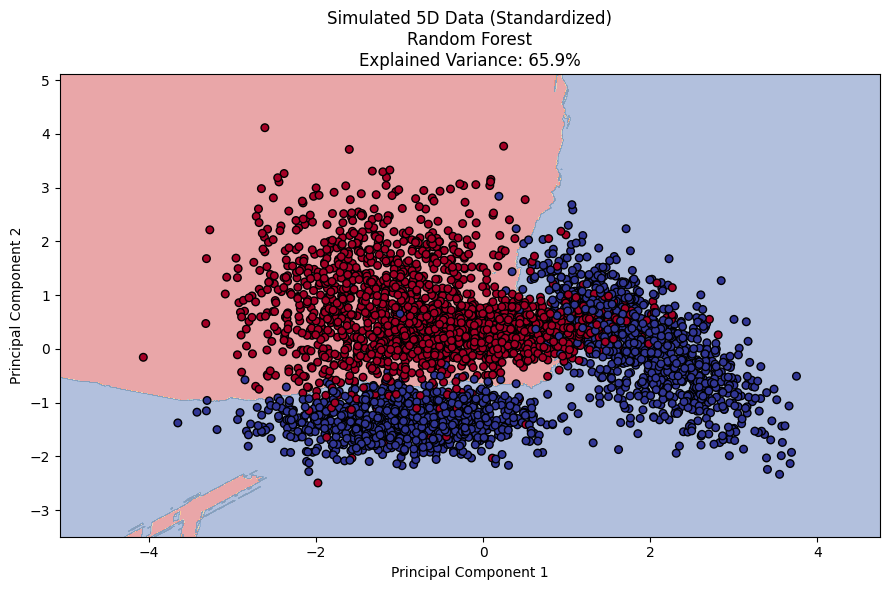

In [54]:
plot_pca_inverse_boundary(X_sim_scaled, y_sim, rf_sim, grid_points=1000,
                          title_prefix=f"Simulated {n_features}D Data (Standardized)\nRandom Forest")

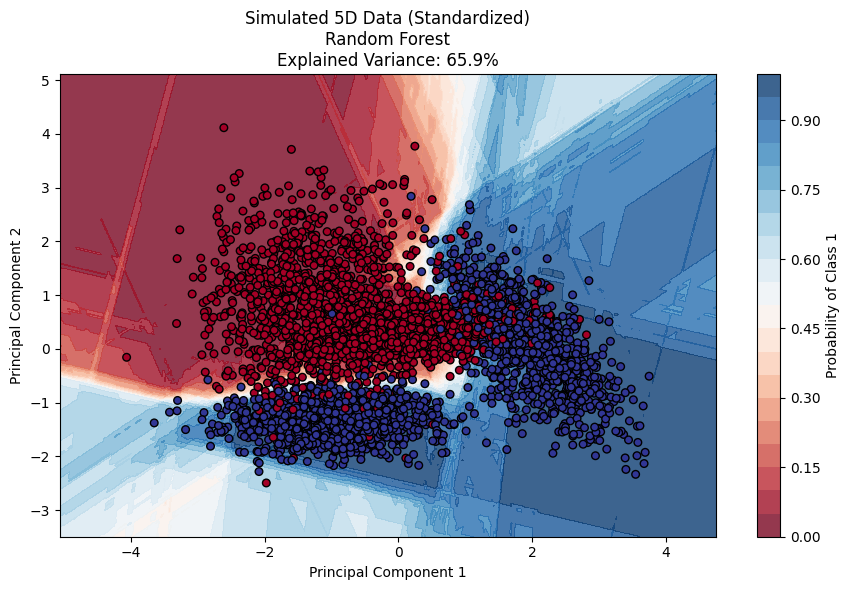

In [55]:
plot_pca_inverse_boundary(X_sim_scaled, y_sim, rf_sim, grid_points=1000, use_proba=True,
                          title_prefix=f"Simulated {n_features}D Data (Standardized)\nRandom Forest")

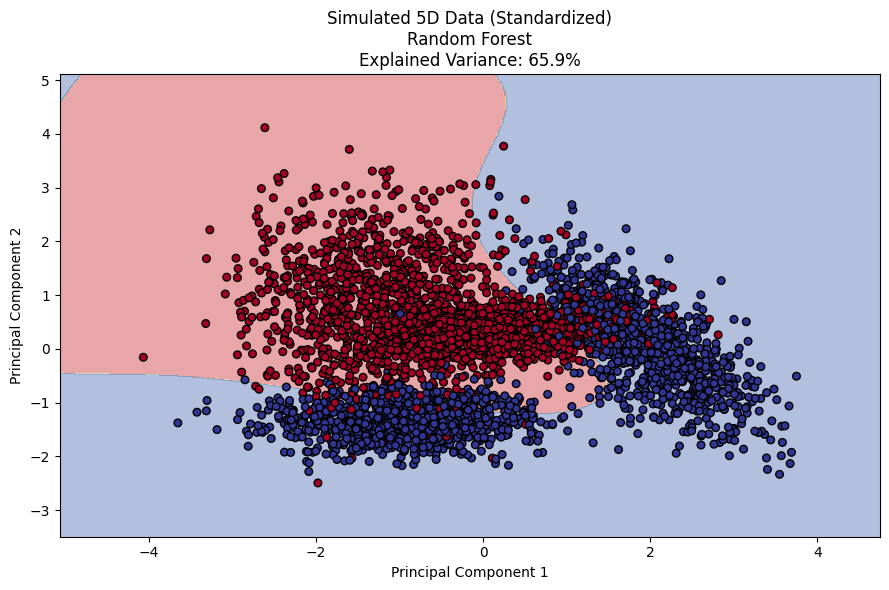

In [ ]:
plot_pca_inverse_boundary(X_sim_scaled, y_sim, svm_sim, grid_points=1000,
                          title_prefix=f"Simulated {n_features}D Data (Standardized)\nSVM")

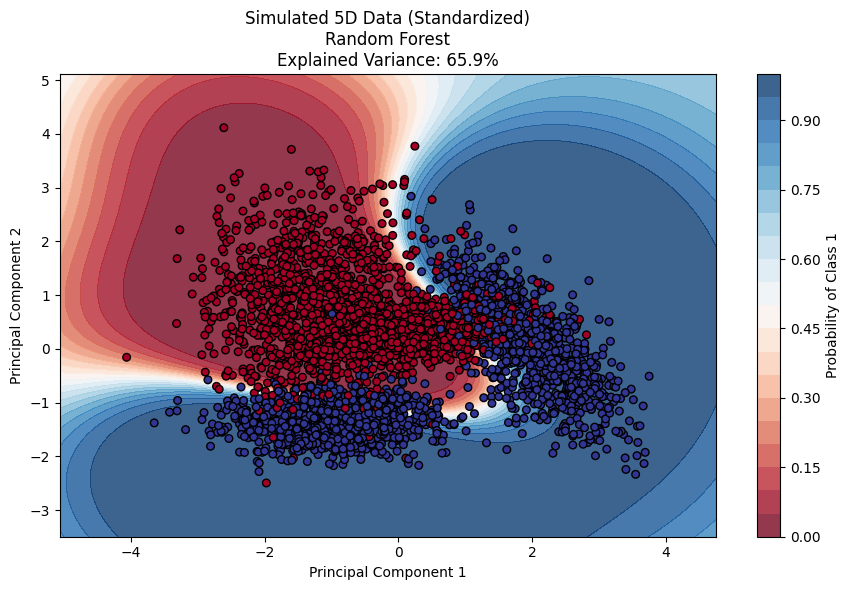

In [ ]:
plot_pca_inverse_boundary(X_sim_scaled, y_sim, svm_sim, grid_points=1000, use_proba=True,
                          title_prefix=f"Simulated {n_features}D Data (Standardized)\nSVM")

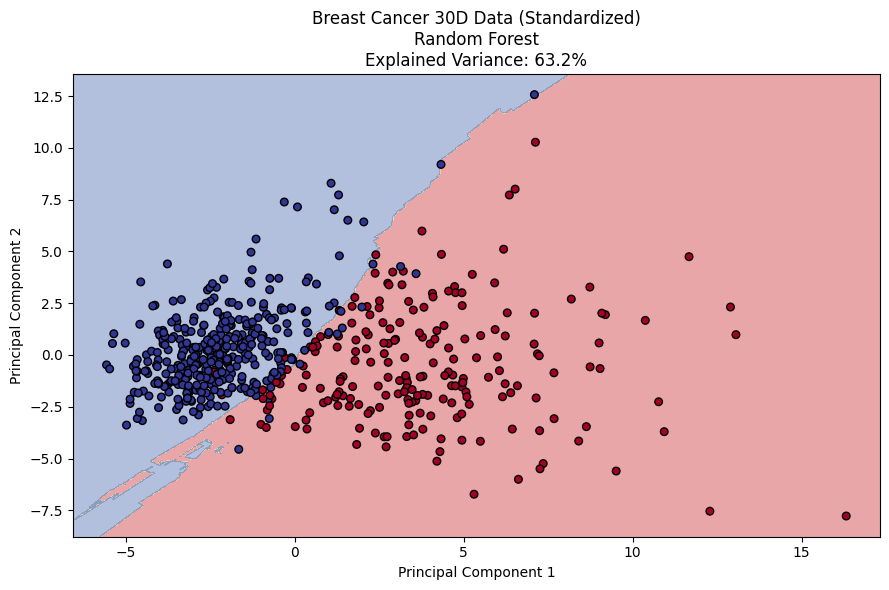

In [61]:
plot_pca_inverse_boundary(X_real_scaled, y_real, rf_real, grid_points=1000,
                          title_prefix="Breast Cancer 30D Data (Standardized)\nRandom Forest")

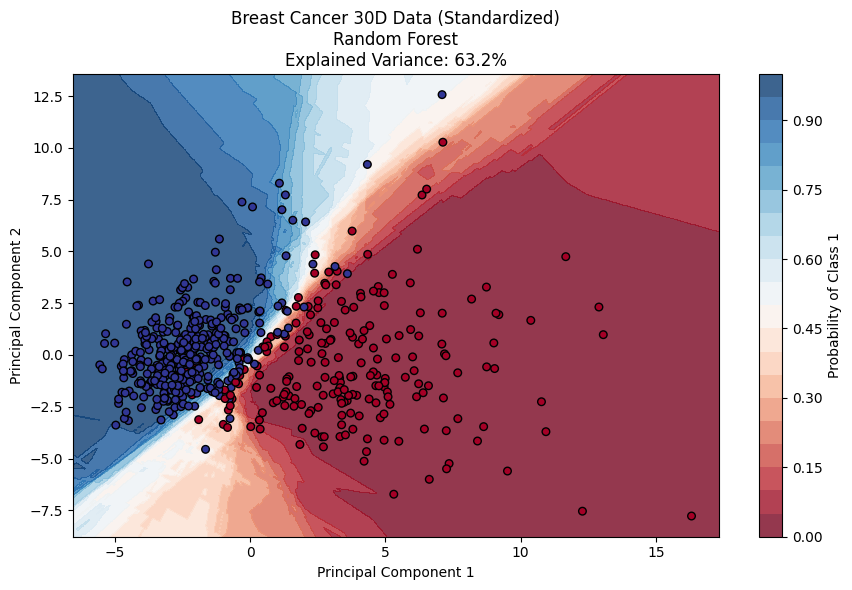

In [62]:
plot_pca_inverse_boundary(X_real_scaled, y_real, rf_real, grid_points=1000, use_proba=True,
                          title_prefix="Breast Cancer 30D Data (Standardized)\nRandom Forest")

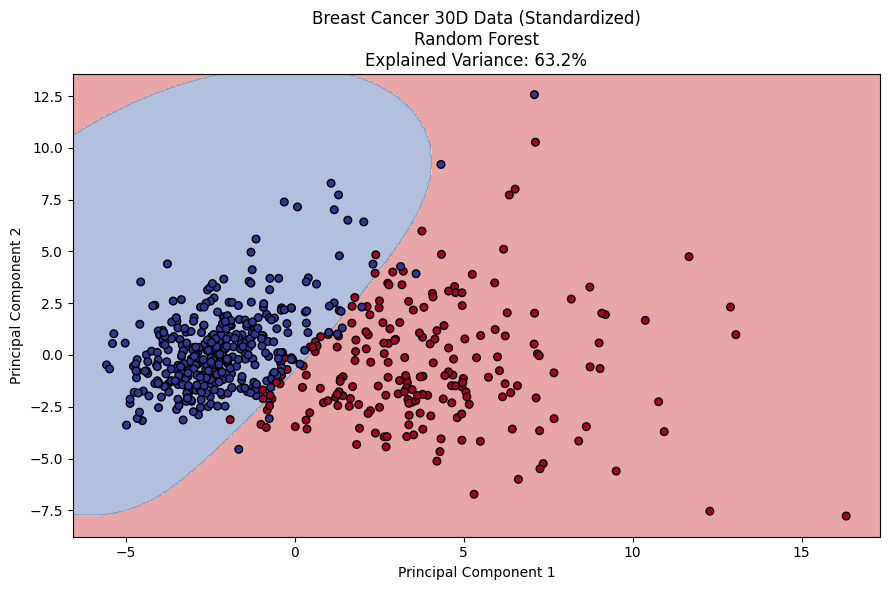

In [63]:
plot_pca_inverse_boundary(X_real_scaled, y_real, svm_real, grid_points=1000,
                          title_prefix="Breast Cancer 30D Data (Standardized)\nSVM")

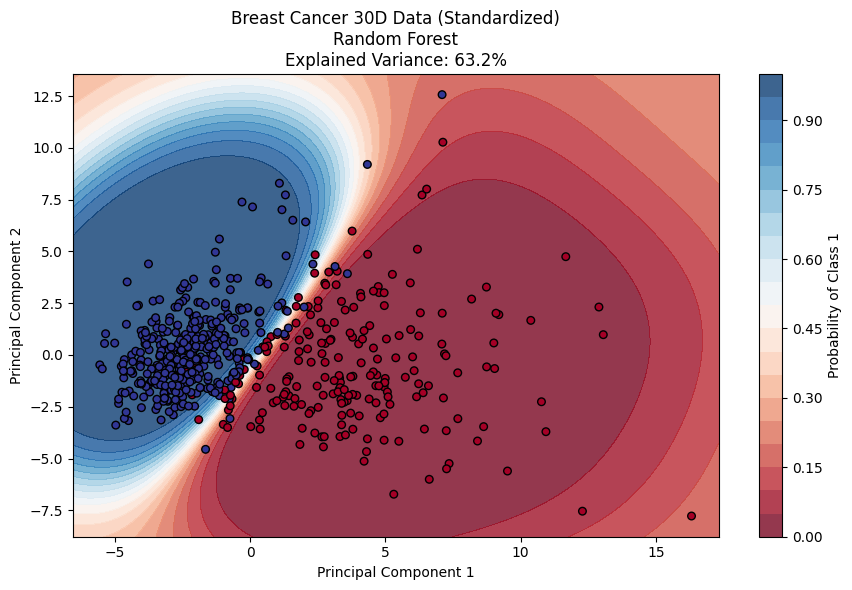

In [64]:
plot_pca_inverse_boundary(X_real_scaled, y_real, svm_real, grid_points=1000, use_proba=True,
                          title_prefix="Breast Cancer 30D Data (Standardized)\nSVM")

### Comparison: First PCA then train model

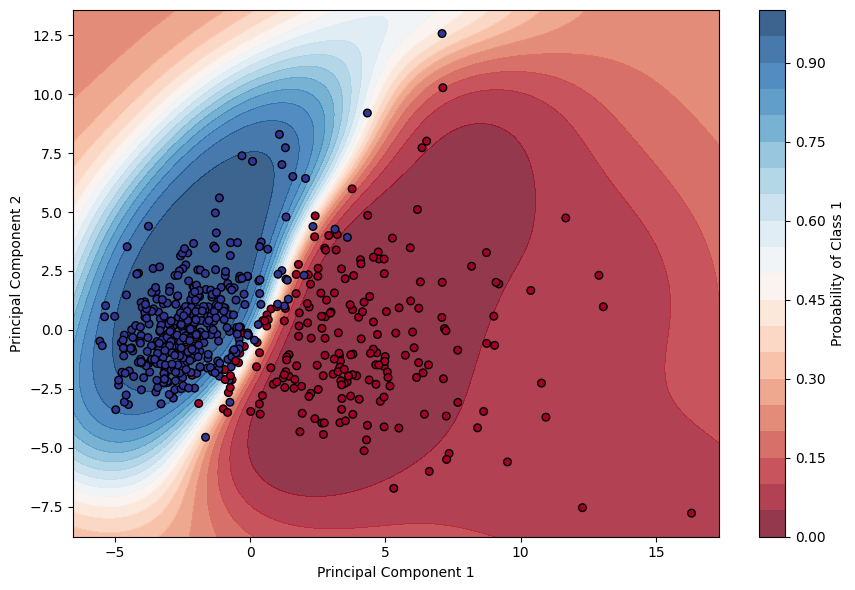

In [ ]:
plt.figure(figsize=(9, 6))
    
grid_points = 1000

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_real_scaled)

model = SVC(kernel='rbf', probability=True, random_state=42)
model.fit(X_pca, y_real)

x_min, x_max = X_pca[:, 0].min() - 1, X_pca[:, 0].max() + 1
y_min, y_max = X_pca[:, 1].min() - 1, X_pca[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, grid_points),
                        np.linspace(y_min, y_max, grid_points))

grid_2d = np.c_[xx.ravel(), yy.ravel()]

Z = model.predict_proba(grid_2d)[:, 1]
cmap = plt.cm.RdBu
levels = np.linspace(0, 1, 21)
Z = Z.reshape(xx.shape)
contour = plt.contourf(xx, yy, Z, levels=levels, alpha=0.8, cmap=cmap, vmin=0, vmax=1)
plt.colorbar(contour, label="Probability of Class 1")
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_real, 
            s=30, edgecolor='k', cmap=plt.cm.RdYlBu)

plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.tight_layout()
plt.show()

### SPLOM inspired approach

In [82]:
def plot_splom_decision_boundaries(X_train, y_train, model, feature_names=None, grid_points=100):
    """
    Creates a Scatter Plot Matrix (SPLOM) of decision boundaries.
    For each 2D plot, the off-axis features are fixed to their mean.
    """
    n_features = X_train.shape[1]
    
    if feature_names is None:
        feature_names = [f"Feature {i}" for i in range(n_features)]
        
    # 1. Define the "Anchor Point" (fixing other dimensions to their mean)
    anchor_point = np.mean(X_train, axis=0)
    
    # 2. Set up the SPLOM figure grid
    fig, axes = plt.subplots(n_features, n_features, figsize=(12, 12))
    fig.suptitle("SPLOM Decision Boundaries\n(Off-axis features fixed at their Mean)", fontsize=16)
    
    # 3. Iterate through every pair of features
    for i in range(n_features):      # Row index (Y-axis of subplot)
        for j in range(n_features):  # Column index (X-axis of subplot)
            
            ax = axes[i, j]
            
            # --- Diagonal: Feature Distributions ---
            if i == j:
                # Plot a simple histogram for the feature
                ax.hist(X_train[y_train==0, i], alpha=0.5, color='blue', density=True)
                ax.hist(X_train[y_train==1, i], alpha=0.5, color='red', density=True)
                ax.set_title(feature_names[i])
                ax.set_xticks([])
                ax.set_yticks([])
                continue
                
            # --- Off-Diagonal: 2D Boundary Slices ---
            
            # Determine axis limits with a slight margin
            x_min, x_max = X_train[:, j].min() - 0.5, X_train[:, j].max() + 0.5
            y_min, y_max = X_train[:, i].min() - 0.5, X_train[:, i].max() + 0.5
            
            # Create 1D arrays using np.linspace as requested
            x_range = np.linspace(x_min, x_max, grid_points)
            y_range = np.linspace(y_min, y_max, grid_points)
            
            # Create the 2D grid for the varying features
            xx, yy = np.meshgrid(x_range, y_range)
            
            # Prepare the N-dimensional grid
            # Start by duplicating the anchor point for every point in our 2D grid
            grid_nd = np.tile(anchor_point, (grid_points * grid_points, 1))
            
            # Overwrite the columns for our two varying features with the grid values
            grid_nd[:, j] = xx.ravel()
            grid_nd[:, i] = yy.ravel()
            
            # Predict using the N-dimensional model
            Z = model.predict(grid_nd)
            Z = Z.reshape(xx.shape)
            
            # Plot the contour slice
            ax.contourf(xx, yy, Z, alpha=0.4, cmap=plt.cm.RdYlBu)
            
            # Plot the actual data points
            # NOTE: These points do NOT perfectly lie on this 2D slice in reality;
            # they are being flattened/projected onto this view.
            ax.scatter(X_train[:, j], X_train[:, i], c=y_train, 
                       s=15, edgecolor='k', alpha=0.6, cmap=plt.cm.RdYlBu)
            
            # Clean up axes labels (only show on edges)
            if i == n_features - 1:
                ax.set_xlabel(feature_names[j])
            else:
                ax.set_xticks([])
                
            if j == 0:
                ax.set_ylabel(feature_names[i])
            else:
                ax.set_yticks([])

    plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout to fit title
    plt.show()


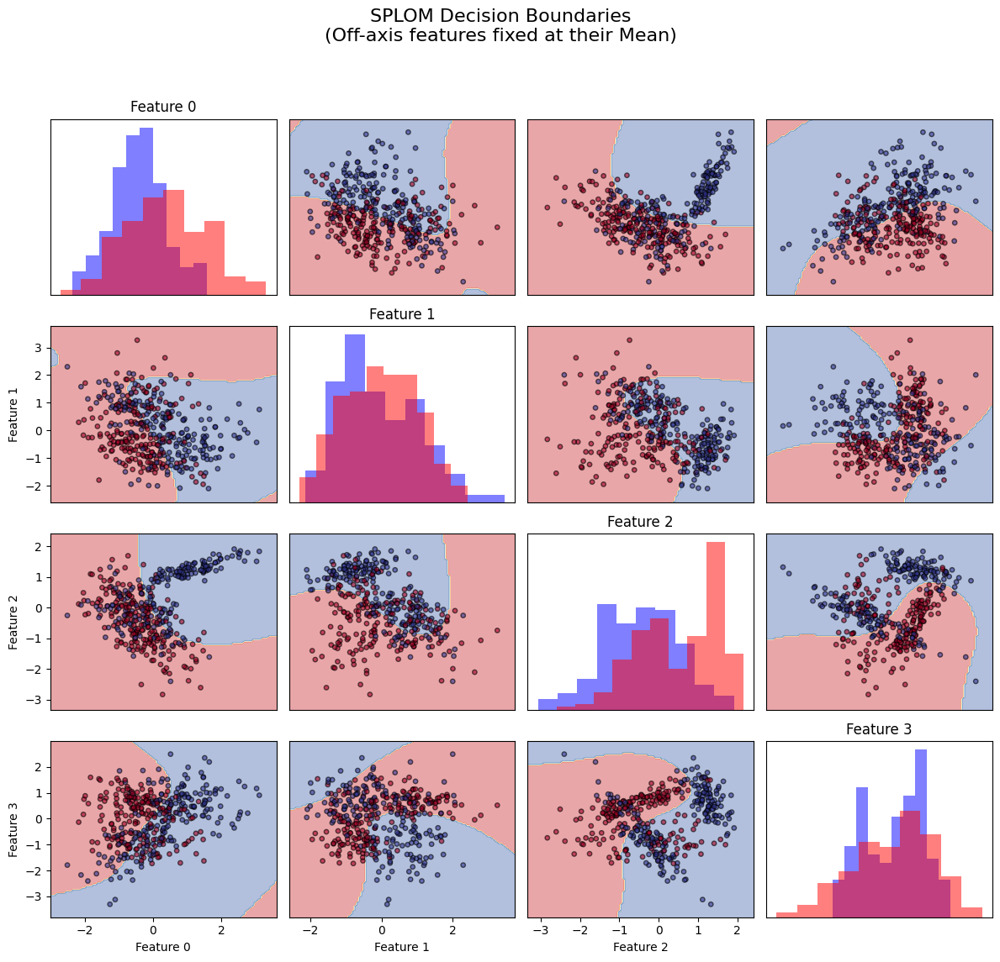

In [83]:
# 1. Generate a 4-dimensional dataset
X, y = make_classification(n_samples=400, n_features=4, 
                           n_informative=4, n_redundant=0, 
                           random_state=42, class_sep=1.2)

# 2. Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 3. Train a model (using SVM for smooth boundaries)
svm_model = SVC(kernel='rbf', random_state=42)
svm_model.fit(X_scaled, y)

# 4. Plot the SPLOM
plot_splom_decision_boundaries(X_scaled, y, svm_model)

We could show the pre-drift boundaries on one triangle and post-drift on the other

### Random Sampling

In [ ]:
def plot_random_sample_pca_boundary(X_train, y_train, model, num_samples=100_000):
    """
    Randomly samples the N-dimensional bounding box, predicts classes,
    and projects the results into 2D PCA space to visualize the boundary.
    """
    n_features = X_train.shape[1]
    
    # 1. Fit PCA to the training data to define our 2D projection axes
    pca = PCA(n_components=2)
    X_train_pca = pca.fit_transform(X_train)
    explained_variance = np.sum(pca.explained_variance_ratio_) * 100
    
    # 2. Find the min and max for each dimension in the original N-dimensional space
    min_vals = X_train.min(axis=0)
    max_vals = X_train.max(axis=0)
    
    # 3. Generate random N-dimensional points within that bounding box
    # We use a uniform distribution for each feature
    random_points_nd = np.random.uniform(low=min_vals, high=max_vals, 
                                         size=(num_samples, n_features))
    
    # 4. Predict the classes of these random N-dimensional points
    random_predictions = model.predict(random_points_nd)
    
    # 5. Project the N-dimensional random points down to 2D using our fitted PCA
    random_points_pca = pca.transform(random_points_nd)
    
    plt.figure(figsize=(10, 8))
    
    # Plot the background cloud of random predictions
    plt.scatter(random_points_pca[:, 0], random_points_pca[:, 1], 
                c=random_predictions, cmap=plt.cm.RdYlBu, 
                alpha=0.15, s=10, edgecolors='none', label='Background (Extrapolation)')
    
    # Overlay the actual training data
    plt.scatter(X_train_pca[:, 0], X_train_pca[:, 1], 
                c=y_train, cmap=plt.cm.RdYlBu, 
                alpha=1.0, s=40, edgecolors='k', label='Training Data')
    
    plt.title(f"Random Sampling PCA Projection ({n_features}D to 2D)\n"
              f"Explained Variance: {explained_variance:.1f}% | Background Points: {num_samples:,}")
    plt.xlabel("Principal Component 1")
    plt.ylabel("Principal Component 2")
    
    # Fix limits to zoom in on the actual data, as the random box projection might stretch further out
    x_margin = (X_train_pca[:, 0].max() - X_train_pca[:, 0].min()) * 0.2
    y_margin = (X_train_pca[:, 1].max() - X_train_pca[:, 1].min()) * 0.2
    plt.xlim(X_train_pca[:, 0].min() - x_margin, X_train_pca[:, 0].max() + x_margin)
    plt.ylim(X_train_pca[:, 1].min() - y_margin, X_train_pca[:, 1].max() + y_margin)
    
    plt.tight_layout()
    plt.show()

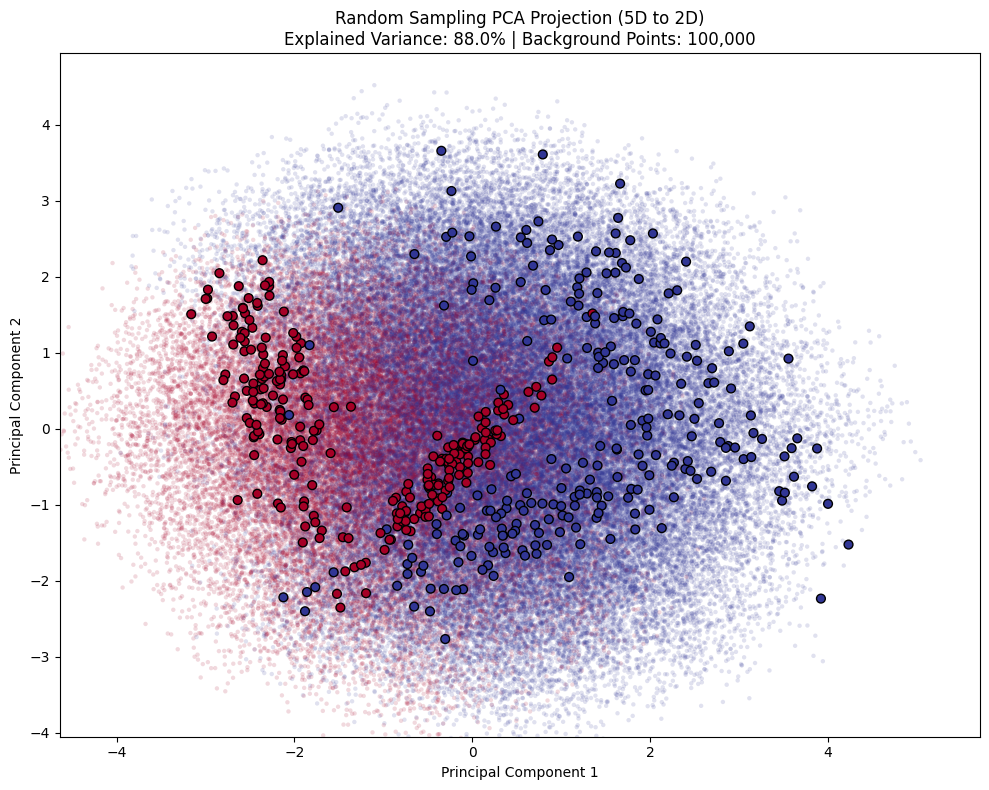

In [91]:
X, y = make_classification(n_samples=500, n_features=5, 
                           n_informative=3, n_redundant=2, 
                           random_state=42, class_sep=1.5)

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Train the model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_scaled, y)

# Run the visualization
plot_random_sample_pca_boundary(X_scaled, y, rf_model, num_samples=100000)

### Drift boundaries

In [98]:
import pandas as pd

In [ ]:
def plot_drift_comparison(X_pre, y_pre, X_post, y_post, model_pre, model_post=None, 
                          projection_method='pca_pre', grid_points=200, 
                          title_prefix="", use_proba=True):
    """
    Plots decision boundaries for pre-drift and post-drift data side-by-side.
    
    Args:
        model_pre: The model trained on reference data.
        model_post: (Optional) A second model trained on current data to visualize Concept Drift. 
                    If None, evaluates the pre-model on post-data (Covariate Shift).
        projection_method: 'dca', 'pca_pre', or 'pca_separate'
    """
    fig, axes = plt.subplots(1, 2, figsize=(16, 6), sharey=True)
    
    # 1. Determine the projection mappings
    if projection_method == 'dca':
        # Assuming your DCA class is available
        dca = DriftComponentAnalysis(n_components=2, by_class=True)
        dca.fit(X_pre, X_post, y_pre, y_post)
        proj_pre, proj_post = dca.pca, dca.pca
        explained_var = np.sum(proj_pre.explained_variance_ratio_) * 100
        fig.suptitle(f"{title_prefix} | Method: DCA | Expl. Var: {explained_var:.1f}%", fontsize=14)
        
    elif projection_method == 'pca_pre':
        pca = PCA(n_components=2).fit(X_pre)
        proj_pre, proj_post = pca, pca
        explained_var = np.sum(pca.explained_variance_ratio_) * 100
        fig.suptitle(f"{title_prefix} | Method: PCA on Pre-Data | Expl. Var: {explained_var:.1f}%", fontsize=14)
        
    elif projection_method == 'pca_separate':
        proj_pre = PCA(n_components=2).fit(X_pre)
        proj_post = PCA(n_components=2).fit(X_post)
        fig.suptitle(f"{title_prefix} | Method: Separate PCAs", fontsize=14)
        
    else:
        raise ValueError("Invalid projection_method.")

    # Determine which model to use for the post-drift plot
    eval_model_post = model_post if model_post is not None else model_pre
    subtitle_post = "Post-Drift Data (Concept Drift - New Model)" if model_post else "Post-Drift Data (Covariate Shift - Old Model)"

    # 2. Setup iteration over the two plots
    plot_configs = [
        (axes[0], X_pre, y_pre, proj_pre, model_pre, "Pre-Drift Data (Reference Model)"),
        (axes[1], X_post, y_post, proj_post, eval_model_post, subtitle_post)
    ]
    
    # 3. Render each subplot
    for ax, X_data, y_data, projector, current_model, subtitle in plot_configs:
        
        # Transform data to 2D
        X_pca = projector.transform(X_data)
        
        # Define grid boundaries
        x_min, x_max = X_pca[:, 0].min() - 1, X_pca[:, 0].max() + 1
        y_min, y_max = X_pca[:, 1].min() - 1, X_pca[:, 1].max() + 1
        
        # Create grid
        xx, yy = np.meshgrid(np.linspace(x_min, x_max, grid_points),
                             np.linspace(y_min, y_max, grid_points))
        grid_2d = np.c_[xx.ravel(), yy.ravel()]
        
        # Inverse transform to N-dimensional space
        grid_nd = projector.inverse_transform(grid_2d)
        
        # Predict using the assigned N-dimensional model for this subplot
        if use_proba and hasattr(current_model, "predict_proba"):
            Z = current_model.predict_proba(grid_nd)[:, 1]
            cmap = plt.cm.RdBu
            levels = np.linspace(0, 1, 21)
        else:
            Z = current_model.predict(grid_nd)
            cmap = plt.cm.RdYlBu
            levels = None
            
        Z = Z.reshape(xx.shape)
        
        # Plot contours and data
        if use_proba:
            contour = ax.contourf(xx, yy, Z, levels=levels, alpha=0.8, cmap=cmap, vmin=0, vmax=1)
        else:
            ax.contourf(xx, yy, Z, alpha=0.4, cmap=cmap)
            
        ax.scatter(X_pca[:, 0], X_pca[:, 1], c=y_data, 
                   s=40, edgecolor='k', cmap=plt.cm.RdYlBu, alpha=0.8)
        
        ax.set_title(subtitle)
        ax.set_xlabel("Component 1")
        if ax == axes[0]:
            ax.set_ylabel("Component 2")
            
    if use_proba:
        cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
        fig.colorbar(contour, cax=cbar_ax, label="Probability of Class 1")
        plt.subplots_adjust(right=0.9)
        
    plt.tight_layout(rect=[0, 0, 0.9, 0.95] if use_proba else [0, 0, 1, 0.95])
    plt.show()

In [108]:
X_pre, y_pre = make_classification(n_samples=500, n_features=6, n_informative=4, random_state=42)
scaler = StandardScaler()
X_pre_scaled = scaler.fit_transform(X_pre)

# model_pre = RandomForestClassifier(n_estimators=100, max_depth=5, random_state=42)
model_pre = SVC(kernel='rbf', random_state=42)
model_pre.fit(X_pre_scaled, y_pre)

# Covariate Shift Data (Features shift, labels follow original rules)
X_post_cov = X_pre.copy()
X_post_cov[:, :2] += 2.5  # Move the data heavily along the first two features
y_post_cov = y_pre        # True underlying rules haven't changed

X_post_cov_scaled = scaler.transform(X_post_cov)

model_post_cov = SVC(kernel='rbf', random_state=42)
model_post_cov.fit(X_post_cov_scaled, y_post_cov)

# Concept Drift Data (Features stay same, labels flip for a specific region)
X_post_con = X_pre.copy()
y_post_con = y_pre.copy()
# Flip labels where feature 0 is greater than 0
mask = X_post_con[:, 0] > 0
y_post_con[mask] = 1 - y_post_con[mask]

X_post_con_scaled = scaler.transform(X_post_con)

# model_post_con = RandomForestClassifier(n_estimators=100, max_depth=5, random_state=42)
model_post_con = SVC(kernel='rbf', random_state=42)
model_post_con.fit(X_post_con_scaled, y_post_con)

,"C C: float, default=1.0Regularization parameter. The strength of the regularization isinversely proportional to C. Must be strictly positive. The penaltyis a squared l2 penalty. For an intuitive visualization of the effectsof scaling the regularization parameter C, see:ref:`sphx_glr_auto_examples_svm_plot_svm_scale_c.py`.",1.0
,"kernel kernel: {'linear', 'poly', 'rbf', 'sigmoid', 'precomputed'} or callable, default='rbf'Specifies the kernel type to be used in the algorithm. Ifnone is given, 'rbf' will be used. If a callable is given it is used topre-compute the kernel matrix from data matrices; that matrix should bean array of shape ``(n_samples, n_samples)``. For an intuitivevisualization of different kernel types see:ref:`sphx_glr_auto_examples_svm_plot_svm_kernels.py`.",'rbf'
,"degree degree: int, default=3Degree of the polynomial kernel function ('poly').Must be non-negative. Ignored by all other kernels.",3
,"gamma gamma: {'scale', 'auto'} or float, default='scale'Kernel coefficient for 'rbf', 'poly' and 'sigmoid'.- if ``gamma='scale'`` (default) is passed then it uses 1 / (n_features * X.var()) as value of gamma,- if 'auto', uses 1 / n_features- if float, must be non-negative... versionchanged:: 0.22 The default value of ``gamma`` changed from 'auto' to 'scale'.",'scale'
,"coef0 coef0: float, default=0.0Independent term in kernel function.It is only significant in 'poly' and 'sigmoid'.",0.0
,"shrinking shrinking: bool, default=TrueWhether to use the shrinking heuristic.See the :ref:`User Guide `.",True
,"probability probability: bool, default=FalseWhether to enable probability estimates. This must be enabled priorto calling `fit`, will slow down that method as it internally uses5-fold cross-validation, and `predict_proba` may be inconsistent with`predict`. Read more in the :ref:`User Guide `.",False
,"tol tol: float, default=1e-3Tolerance for stopping criterion.",0.001
,"cache_size cache_size: float, default=200Specify the size of the kernel cache (in MB).",200
,"class_weight class_weight: dict or 'balanced', default=NoneSet the parameter C of class i to class_weight[i]*C forSVC. If not given, all classes are supposed to haveweight one.The ""balanced"" mode uses the values of y to automatically adjustweights inversely proportional to class frequencies in the input dataas ``n_samples / (n_classes * np.bincount(y))``.",None
,"verbose verbose: bool, default=FalseEnable verbose output. Note that this setting takes advantage of aper-process runtime setting in libsvm that, if enabled, may not workproperly in a multithreaded context.",False



--------------------------------------------------
Testing Projection Method: PCA_PRE
--------------------------------------------------
Model: SINGLE
Drift Type: COVARIATE


C:\Users\barte\AppData\Local\Temp\ipykernel_37904\1918281815.py:97: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95] if use_proba else [0, 0, 1, 0.95])


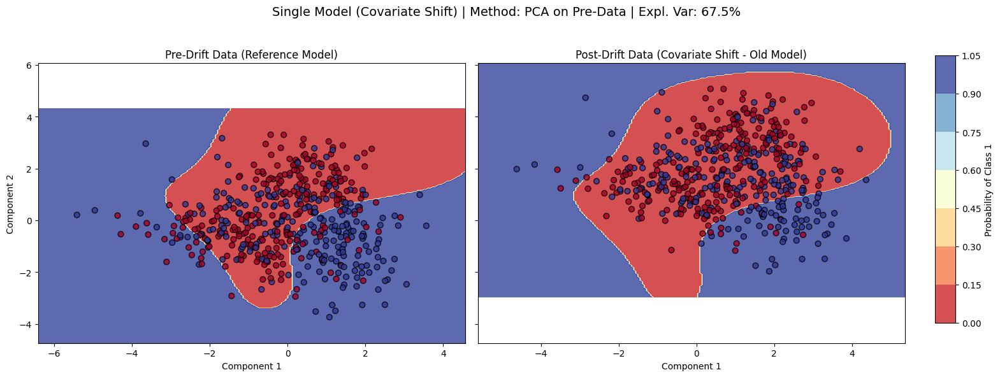


--------------------------------------------------
Testing Projection Method: PCA_PRE
--------------------------------------------------
Model: SINGLE
Drift Type: CONCEPT


C:\Users\barte\AppData\Local\Temp\ipykernel_37904\1918281815.py:97: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95] if use_proba else [0, 0, 1, 0.95])


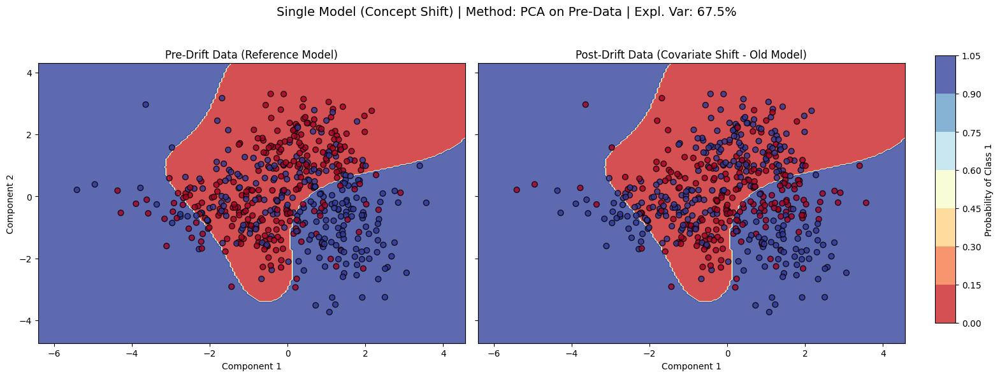


--------------------------------------------------
Testing Projection Method: PCA_PRE
--------------------------------------------------
Model: SEPARATE
Drift Type: COVARIATE


C:\Users\barte\AppData\Local\Temp\ipykernel_37904\1918281815.py:97: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95] if use_proba else [0, 0, 1, 0.95])


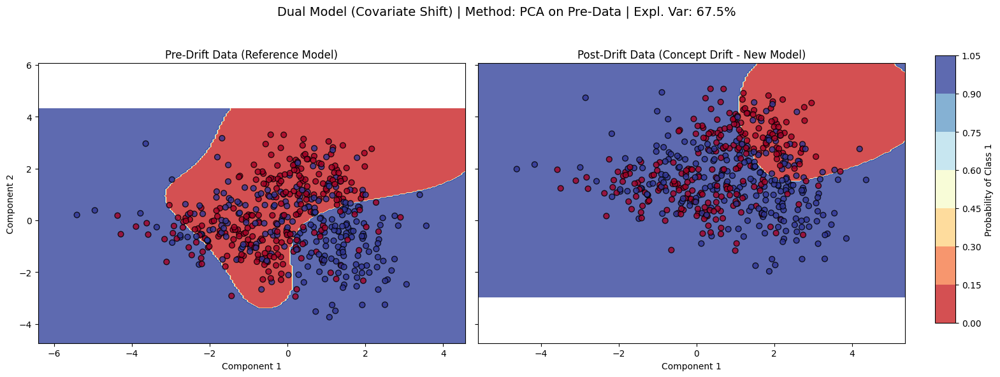


--------------------------------------------------
Testing Projection Method: PCA_PRE
--------------------------------------------------
Model: SEPARATE
Drift Type: CONCEPT


C:\Users\barte\AppData\Local\Temp\ipykernel_37904\1918281815.py:97: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95] if use_proba else [0, 0, 1, 0.95])


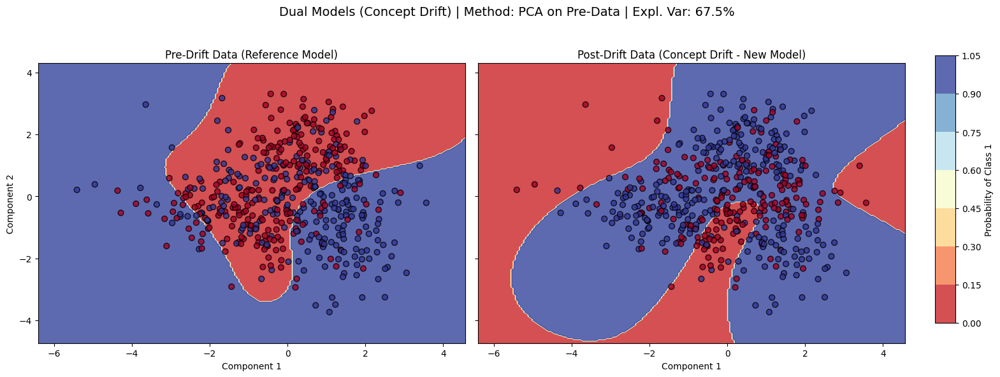


--------------------------------------------------
Testing Projection Method: DCA
--------------------------------------------------
Model: SINGLE
Drift Type: COVARIATE


C:\Users\barte\AppData\Local\Temp\ipykernel_37904\1918281815.py:97: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95] if use_proba else [0, 0, 1, 0.95])


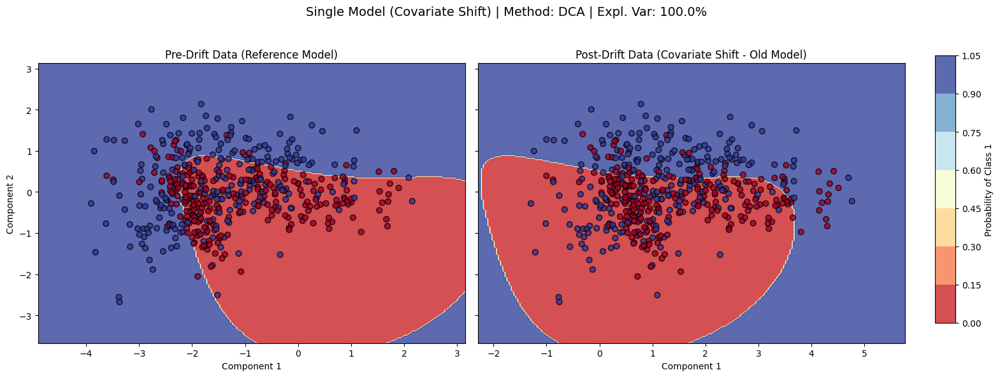


--------------------------------------------------
Testing Projection Method: DCA
--------------------------------------------------
Model: SINGLE
Drift Type: CONCEPT


C:\Users\barte\AppData\Local\Temp\ipykernel_37904\1918281815.py:97: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95] if use_proba else [0, 0, 1, 0.95])


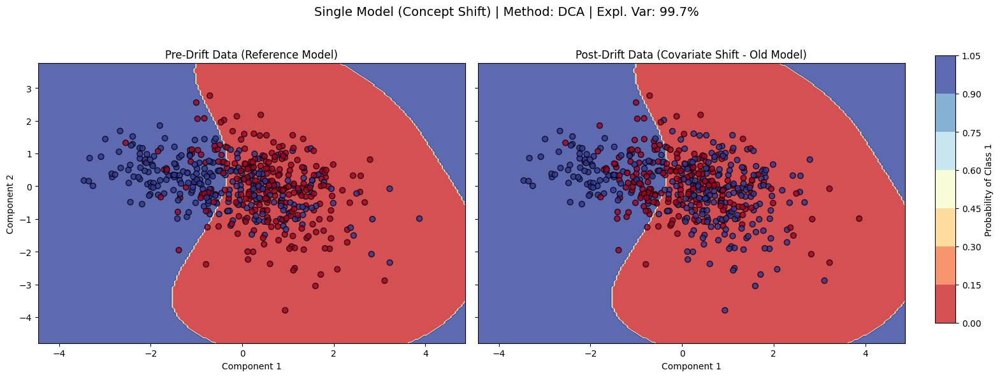


--------------------------------------------------
Testing Projection Method: DCA
--------------------------------------------------
Model: SEPARATE
Drift Type: COVARIATE


C:\Users\barte\AppData\Local\Temp\ipykernel_37904\1918281815.py:97: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95] if use_proba else [0, 0, 1, 0.95])


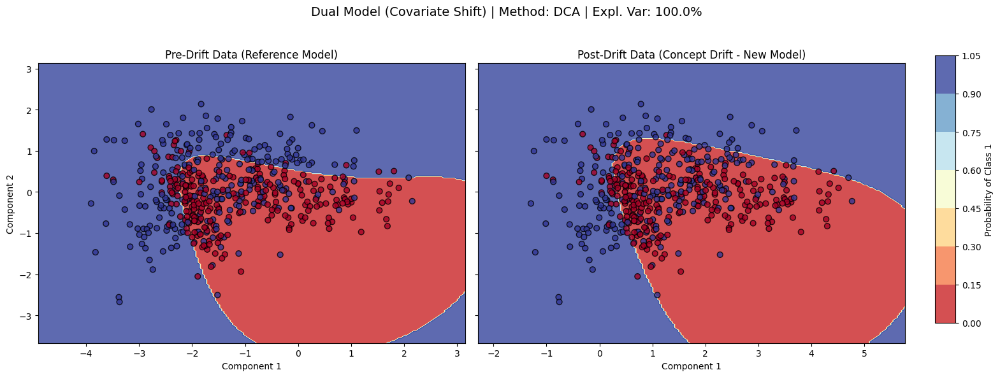


--------------------------------------------------
Testing Projection Method: DCA
--------------------------------------------------
Model: SEPARATE
Drift Type: CONCEPT


C:\Users\barte\AppData\Local\Temp\ipykernel_37904\1918281815.py:97: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95] if use_proba else [0, 0, 1, 0.95])


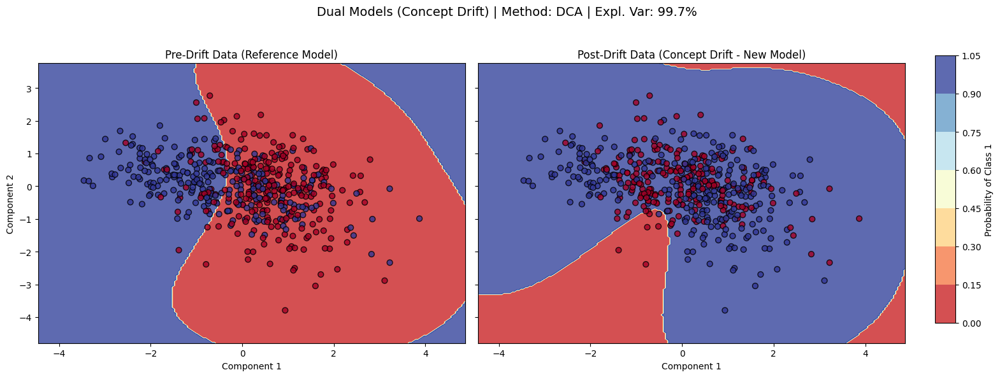


--------------------------------------------------
Testing Projection Method: PCA_SEPARATE
--------------------------------------------------
Model: SINGLE
Drift Type: COVARIATE


C:\Users\barte\AppData\Local\Temp\ipykernel_37904\1918281815.py:97: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95] if use_proba else [0, 0, 1, 0.95])


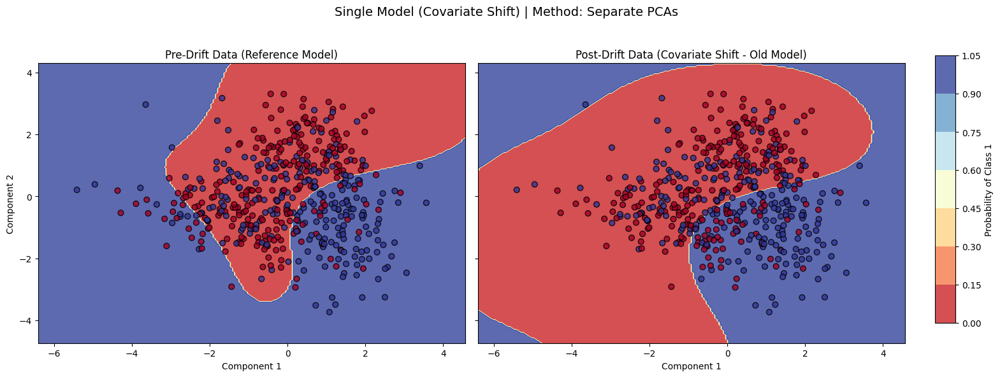


--------------------------------------------------
Testing Projection Method: PCA_SEPARATE
--------------------------------------------------
Model: SINGLE
Drift Type: CONCEPT


C:\Users\barte\AppData\Local\Temp\ipykernel_37904\1918281815.py:97: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95] if use_proba else [0, 0, 1, 0.95])


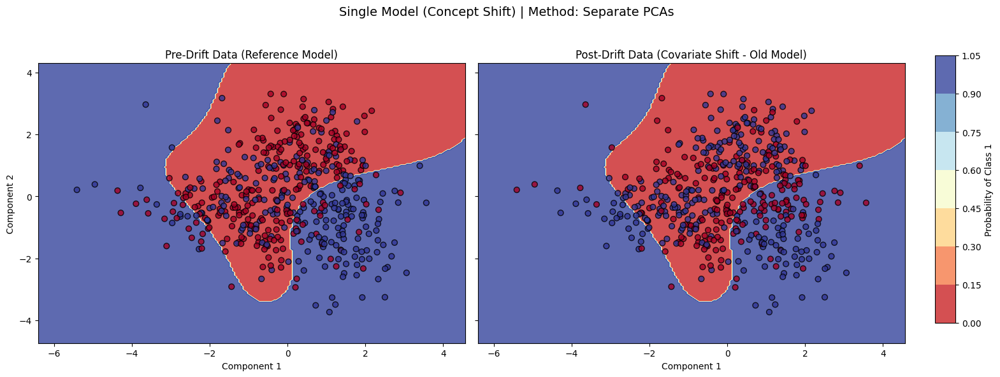


--------------------------------------------------
Testing Projection Method: PCA_SEPARATE
--------------------------------------------------
Model: SEPARATE
Drift Type: COVARIATE


C:\Users\barte\AppData\Local\Temp\ipykernel_37904\1918281815.py:97: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95] if use_proba else [0, 0, 1, 0.95])


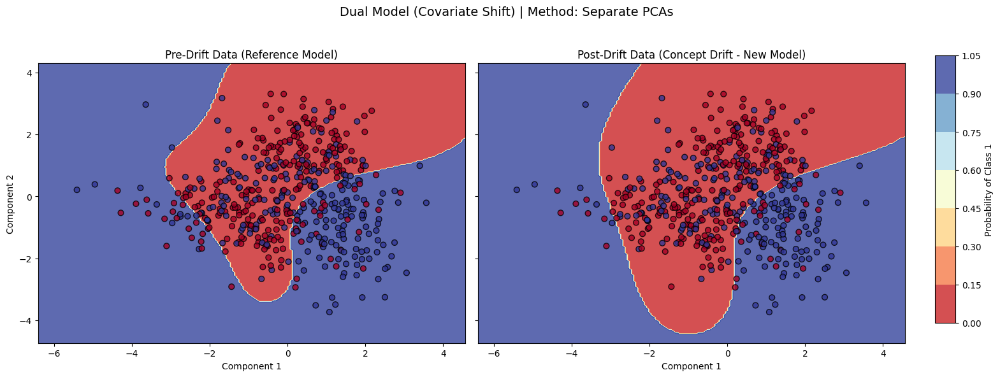


--------------------------------------------------
Testing Projection Method: PCA_SEPARATE
--------------------------------------------------
Model: SEPARATE
Drift Type: CONCEPT


C:\Users\barte\AppData\Local\Temp\ipykernel_37904\1918281815.py:97: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95] if use_proba else [0, 0, 1, 0.95])


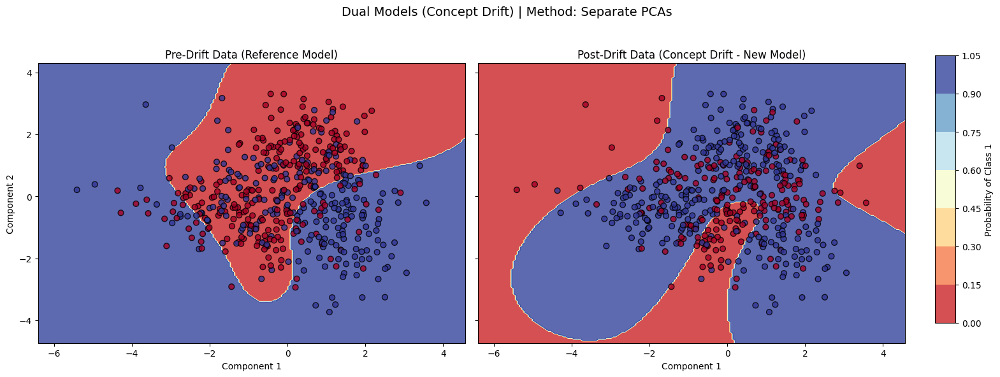

In [109]:
projection_methods = ['pca_pre', 'dca', 'pca_separate']
models = ['single', 'separate']
drift = ['covariate', 'concept']

for proj in projection_methods:
    for model in models:
        for drift_type in drift:
            print(f"\n{'-'*50}\nTesting Projection Method: {proj.upper()}\n{'-'*50}")
            print(f"Model: {model.upper()}")
            print(f"Drift Type: {drift_type.upper()}")
    
            if model == 'single':
                if drift_type == 'covariate':
                    plot_drift_comparison(X_pre_scaled, y_pre, 
                                        X_post_cov_scaled, y_post_cov, 
                                        model_pre=model_pre, model_post=None, 
                                        projection_method=proj, 
                                        title_prefix="Single Model (Covariate Shift)")
                if drift_type == 'concept':
                    plot_drift_comparison(X_pre_scaled, y_pre, 
                                        X_post_con_scaled, y_post_con, 
                                        model_pre=model_pre, model_post=None, 
                                        projection_method=proj, 
                                        title_prefix="Single Model (Concept Shift)")

            elif model == 'separate':
                if drift_type == 'covariate':
                    plot_drift_comparison(X_pre_scaled, y_pre, 
                                        X_post_cov_scaled, y_post_cov, 
                                        model_pre=model_pre, model_post=model_post_cov, 
                                        projection_method=proj, 
                                        title_prefix="Dual Model (Covariate Shift)")
                if drift_type == 'concept':
                    plot_drift_comparison(X_pre_scaled, y_pre, 
                                        X_post_con_scaled, y_post_con, 
                                        model_pre=model_pre, model_post=model_post_con, 
                                        projection_method=proj, 
                                        title_prefix="Dual Models (Concept Drift)")
                                        

In [110]:
df_pre = pd.read_csv("../data/stream_datasets/sea_pre.csv")
df_post = pd.read_csv("../data/stream_datasets/sea_post.csv")

X_pre = df_pre.iloc[:, :-1]
y_pre = df_pre.iloc[:, -1].values
X_post = df_post.iloc[:, :-1]
y_post = df_post.iloc[:, -1].values

feature_names = list(X_pre.columns)

# Scale data
scaler = StandardScaler()
X_pre_scaled = scaler.fit_transform(X_pre)

# Separate scaling for post drift?
# Separate scaling is more about the shape of concept?
X_post_scaled = scaler.fit_transform(X_post)
# X_post_scaled = scaler.transform(X_post)

model_pre = SVC(kernel='rbf', random_state=42)
model_pre.fit(X_pre_scaled, y_pre)

model_post = SVC(kernel='rbf', random_state=42)
model_post.fit(X_post_scaled, y_post)

,"C C: float, default=1.0Regularization parameter. The strength of the regularization isinversely proportional to C. Must be strictly positive. The penaltyis a squared l2 penalty. For an intuitive visualization of the effectsof scaling the regularization parameter C, see:ref:`sphx_glr_auto_examples_svm_plot_svm_scale_c.py`.",1.0
,"kernel kernel: {'linear', 'poly', 'rbf', 'sigmoid', 'precomputed'} or callable, default='rbf'Specifies the kernel type to be used in the algorithm. Ifnone is given, 'rbf' will be used. If a callable is given it is used topre-compute the kernel matrix from data matrices; that matrix should bean array of shape ``(n_samples, n_samples)``. For an intuitivevisualization of different kernel types see:ref:`sphx_glr_auto_examples_svm_plot_svm_kernels.py`.",'rbf'
,"degree degree: int, default=3Degree of the polynomial kernel function ('poly').Must be non-negative. Ignored by all other kernels.",3
,"gamma gamma: {'scale', 'auto'} or float, default='scale'Kernel coefficient for 'rbf', 'poly' and 'sigmoid'.- if ``gamma='scale'`` (default) is passed then it uses 1 / (n_features * X.var()) as value of gamma,- if 'auto', uses 1 / n_features- if float, must be non-negative... versionchanged:: 0.22 The default value of ``gamma`` changed from 'auto' to 'scale'.",'scale'
,"coef0 coef0: float, default=0.0Independent term in kernel function.It is only significant in 'poly' and 'sigmoid'.",0.0
,"shrinking shrinking: bool, default=TrueWhether to use the shrinking heuristic.See the :ref:`User Guide `.",True
,"probability probability: bool, default=FalseWhether to enable probability estimates. This must be enabled priorto calling `fit`, will slow down that method as it internally uses5-fold cross-validation, and `predict_proba` may be inconsistent with`predict`. Read more in the :ref:`User Guide `.",False
,"tol tol: float, default=1e-3Tolerance for stopping criterion.",0.001
,"cache_size cache_size: float, default=200Specify the size of the kernel cache (in MB).",200
,"class_weight class_weight: dict or 'balanced', default=NoneSet the parameter C of class i to class_weight[i]*C forSVC. If not given, all classes are supposed to haveweight one.The ""balanced"" mode uses the values of y to automatically adjustweights inversely proportional to class frequencies in the input dataas ``n_samples / (n_classes * np.bincount(y))``.",None
,"verbose verbose: bool, default=FalseEnable verbose output. Note that this setting takes advantage of aper-process runtime setting in libsvm that, if enabled, may not workproperly in a multithreaded context.",False



--------------------------------------------------
Testing Projection Method: PCA_PRE
--------------------------------------------------


C:\Users\barte\AppData\Local\Temp\ipykernel_37904\1918281815.py:97: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95] if use_proba else [0, 0, 1, 0.95])


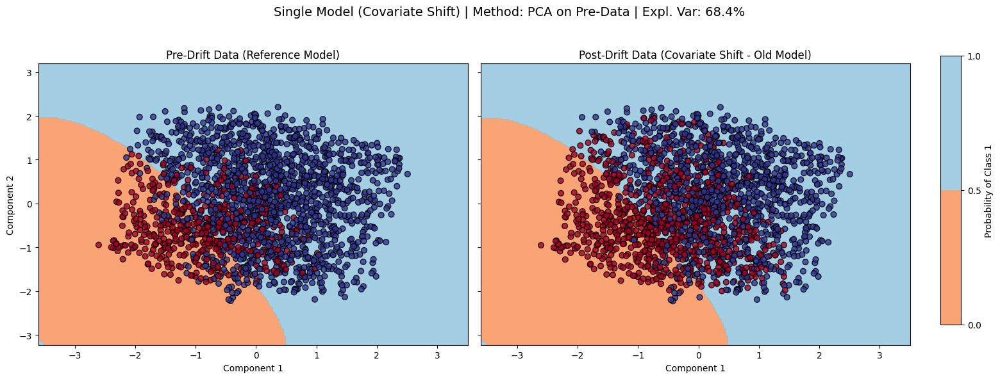

C:\Users\barte\AppData\Local\Temp\ipykernel_37904\1918281815.py:97: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95] if use_proba else [0, 0, 1, 0.95])


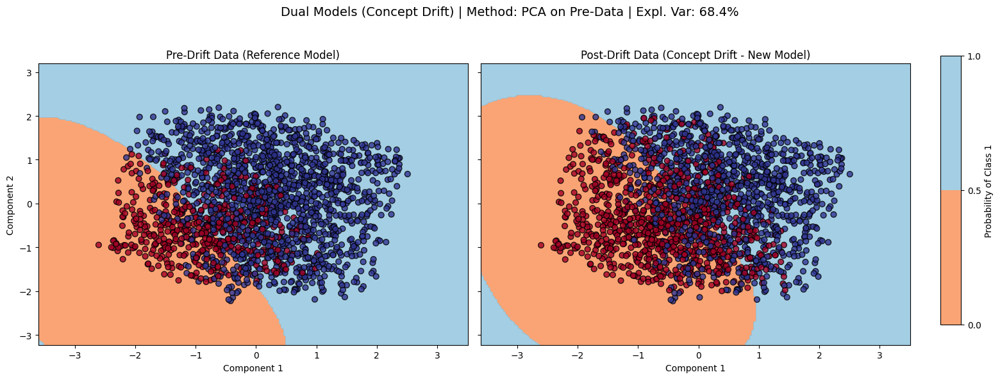


--------------------------------------------------
Testing Projection Method: DCA
--------------------------------------------------


C:\Users\barte\AppData\Local\Temp\ipykernel_37904\1918281815.py:97: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95] if use_proba else [0, 0, 1, 0.95])


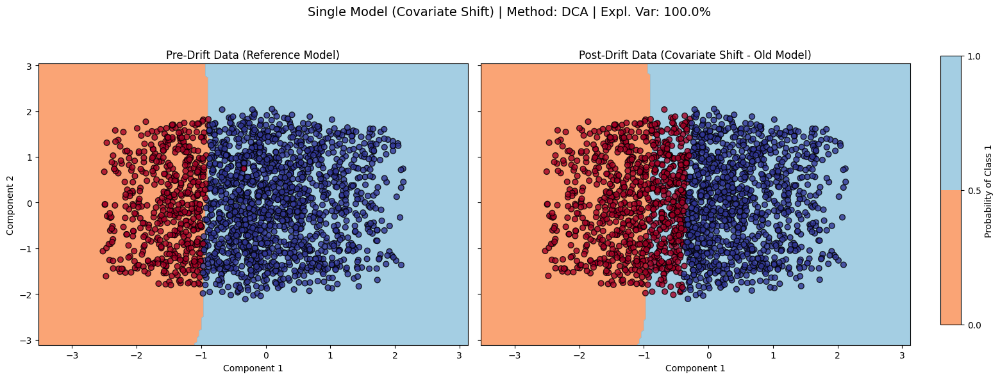

C:\Users\barte\AppData\Local\Temp\ipykernel_37904\1918281815.py:97: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95] if use_proba else [0, 0, 1, 0.95])


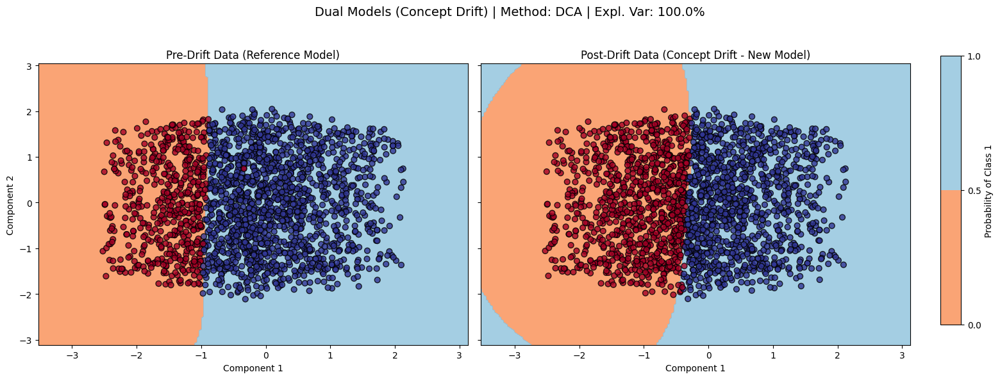

In [111]:
projection_methods = ['pca_pre', 'dca']
for proj in projection_methods:
    print(f"\n{'-'*50}\nTesting Projection Method: {proj.upper()}\n{'-'*50}")
    
    # Test 1: Single Model (Diagnosing Covariate Shift)
    # We pass only model_pre, evaluating it on the shifted data.
    plot_drift_comparison(X_pre_scaled, y_pre, 
                          X_post_scaled, y_post, 
                          model_pre=model_pre, model_post=None, 
                          projection_method=proj, 
                          title_prefix="Single Model (Covariate Shift)")

    # Test 2: Dual Models (Diagnosing Concept Drift)
    # We pass both models, evaluating how the new model adapted to the flipped labels.
    plot_drift_comparison(X_pre_scaled, y_pre, 
                          X_post_scaled, y_post, 
                          model_pre=model_pre, model_post=model_post, 
                          projection_method=proj, 
                          title_prefix="Dual Models (Concept Drift)")